# Введение

_____
    
**Название проекта**

Сегментация кур на изображениях для мониторинга поголовья

_____
**Цель исследования**
    
Разработать и обучить модель глубокого обучения, способную с высокой точностью определять пиксели, принадлежащие курам, на входном изображении.
_____
**План работы**

1. Загрузка и анализ данных: Изучение формата разметки и визуализация примеров.
2. Подготовка данных: Создание пайплайна данных, включающий аугментацию изображений и масок.
3. Моделирование: Эксперименты с различными архитектурами, включая U-Net с нуля и U-Net с предобученным энкодером.
4. Обучение: Настройка и запуск процесса обучения с использованием подходящих функций потерь и метрик.
5. Оценка: Финальная оценка качества лучшей модели на отложенной тестовой выборке.
6. Выводы: Формулирование итогов работы и возможных путей для дальнейшего улучшения.

_____

# Загрузка данных

## Импорт библиотек

___
    Импортируем все необходимые нам библиотеки
    И установим константные переменные
___

In [1]:
%pip install matplotlib -q
%pip install kagglehub -q
%pip install tensorflow -q
%pip install seaborn -q
%pip install ipywidgets -q
%pip install opencv-python -q
%pip install scikit-learn -q
%pip install tf-keras -q
%pip install segmentation-models -q
%pip install albumentations -q 

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

# Стандартные библиотеки
import math
import random
from pathlib import Path

# Библиотеки для работы с данными и визуализации
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import albumentations as A

# Основные библиотеки для глубокого обучения
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import layers, Model, Input
import tensorflow.keras.backend as K
from tensorflow.keras.metrics import MeanIoU
# Библиотека для моделей сегментации
import segmentation_models as sm



# Настройки для воспроизводимости
RANDOM_SEED = 42
tf.random.set_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

# Параметры данных и модели
IMG_SIZE = 256
N_CHANNELS = 3
BATCH_SIZE = 8  
AUTOTUNE = tf.data.AUTOTUNE
checkpoint_path = "unet_chicken_best_model.h5" # путь к сохранению лучшей модели
EPOCHS = 30

# Пути к данным
BASE_DIR = Path('data')
IMAGE_DIR = BASE_DIR / 'images'
LABEL_DIR = BASE_DIR / 'labels'

# Настройки для визуализаций
plt.rcParams['axes.titlesize'] = 21

/home/koziy/projects/test-chicken/lib/python3.12/site-packages/albumentations/check_version.py:147: UserWarning: Error fetching version info <urlopen error [Errno 101] Network is unreachable>
  data = fetch_version_info()
2025-09-09 13:33:40.333003: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-09 13:33:41.191569: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-09-09 13:33:43.082366: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical re

Segmentation Models: using `tf.keras` framework.


## Сопоставление данных

___
    Сопоставим изображения и разметку
___

In [3]:
# напишем функцию для сопоставления
def get_file_map(image_dir, label_dir):
    file_map = {}
    
    # получим изображение
    for image_path in image_dir.glob('*.jpg'):
        file_stem = image_path.stem
        file_map[file_stem] = {'image': str(image_path)}

    # получим для изображения метки
    for label_path in label_dir.glob('*.txt'):
        file_stem = label_path.stem
        if file_stem in file_map:
            file_map[file_stem]['label'] = str(label_path)

    # сохраним пару     
    paired_files = [
        (data['image'], data['label']) for key, data in file_map.items()
    ]
            
    return paired_files

In [4]:
file_pairs = get_file_map(IMAGE_DIR, LABEL_DIR)

print(f"Найдено {len(file_pairs)} пар изображение-разметка.")

Найдено 1141 пар изображение-разметка.


# Анализ данных

---

Исходные данные для разметки предоставлены в виде текстовых файлов, где каждый объект описан набором координат вершин полигона

Для обучения модели сегментации необходимо преобразовать эти полигоны в бинарные маски изображений.

Для этого была написана функция polygons_to_mask. Чтобы убедиться в корректности ее работы, мы визуализируем несколько случайных примеров:

1. Оригинальное изображение.
2. Сгенерированная маска. Черно-белое изображение, где белые области соответствуют курам.
3. Изображение с наложенным контуром. Контуры, полученные из маски, накладываются на оригинал для проверки точности совпадения.


---

In [5]:
# напишем функцию получения маски из координат
def polygons_to_mask(label_path, height, width):
    mask = np.zeros((height, width), dtype=np.uint8)
    if not Path(label_path).exists():
        return mask
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            coords_normalized = np.array(parts[1:], dtype=np.float32)
            coords = coords_normalized.reshape(-1, 2)
            coords[:, 0] *= width
            coords[:, 1] *= height
            pts = coords.astype(np.int32)
            cv2.fillPoly(mask, [pts], color=(255))
    return mask

In [6]:
def visualize_random_sample(file_pairs):
    for i in range(3):
        # выберем случайное изображение
        image_path, label_path = random.choice(file_pairs)

        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        height, width, _ = image_rgb.shape
        
        # создадим маску
        mask = polygons_to_mask(label_path, height, width)
        overlay = image_rgb.copy()
        contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        
        cv2.drawContours(overlay, contours, -1, (255, 0, 0), 2) # Красные контуры толщиной 2 пикселя
        
        # выведем изображение
        fig, axes = plt.subplots(1, 3, figsize=(24, 8))
        
        axes[0].imshow(image_rgb)
        axes[0].set_title("Оригинальное изображение")
        axes[0].axis('off')
        
        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title("Сгенерированная маска")
        axes[1].axis('off')
        
        axes[2].imshow(overlay)
        axes[2].set_title("Изображение с контуром")
        axes[2].axis('off')
        
        plt.tight_layout()
        plt.show()

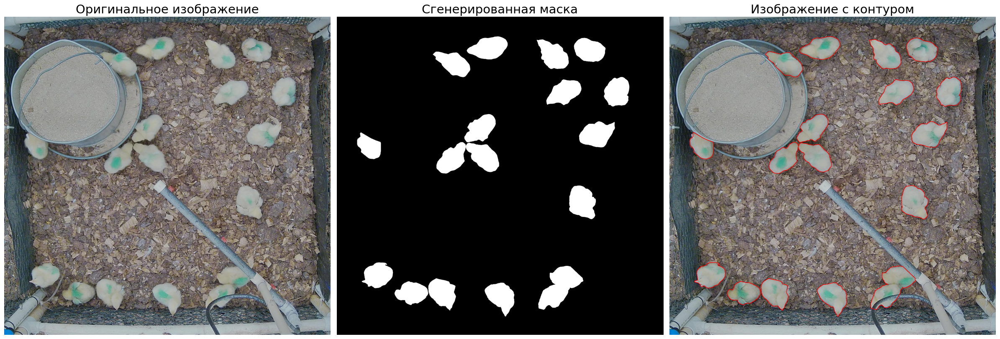

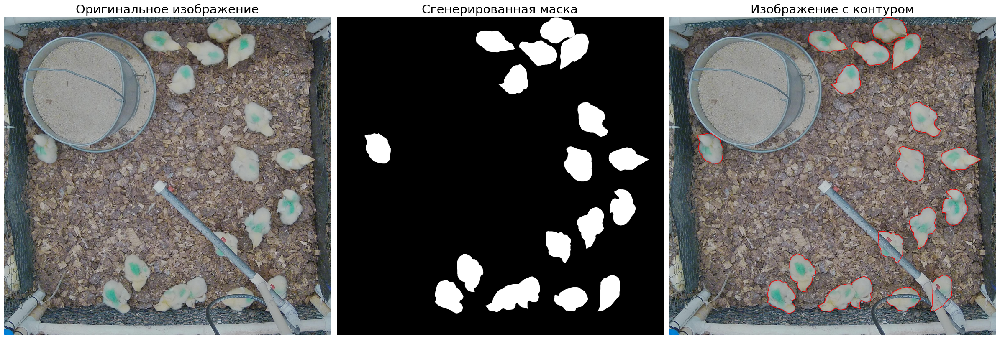

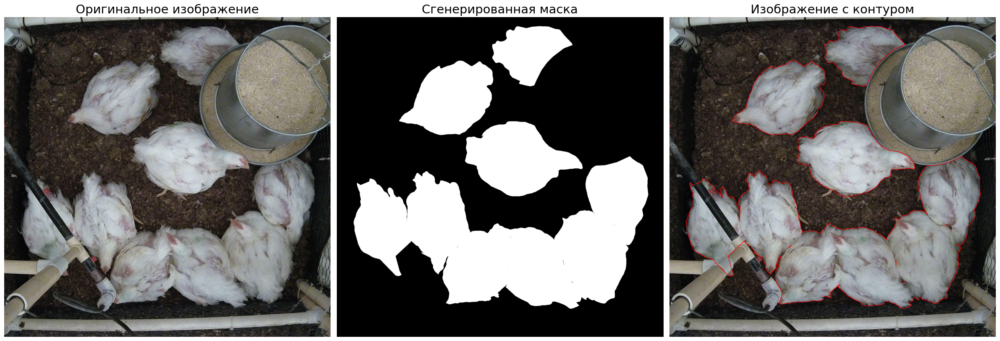

In [7]:
visualize_random_sample(file_pairs)

# Предподготовка

---

Мы создадим пайплайн. Весь процесс будет состоять из нескольких шагов:

1. Разделение выборки

Мы разделим все данные на три части в пропорции:

- Обучающая выборка (train): 80% данных, на которых модель будет непосредственно обучаться.
- Валидационная выборка (val): 10% данных, используемых в процессе обучения для подбора гиперпараметров и выбора лучшей эпохи модели.
- Тестовая выборка (test): 10% данных, которые модель никогда не видит до конца.


2. Генератор данных

Функция data_generator загружает пары (изображение, разметка), преобразует полигоны в маску, изменяет размер до (256x256) и нормализует значения пикселей в диапазон [0, 1].

---

In [8]:
def data_generator(file_pairs):
    for img_path, mask_path in file_pairs:
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w, _ = image.shape
        mask = polygons_to_mask(mask_path, h, w)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE))
        yield image, mask

In [9]:
train_files, val_test_files = train_test_split(file_pairs, test_size=0.2, random_state=RANDOM_SEED)
val_files, test_files = train_test_split(val_test_files, test_size=0.5, random_state=RANDOM_SEED)

print(f"Общее количество примеров: {len(file_pairs)}")
print(f"Количество для обучения (train): {len(train_files)}")
print(f"Количество для валидации (validation): {len(val_files)}")
print(f"Количество для теста (test): {len(test_files)}")

Общее количество примеров: 1141
Количество для обучения (train): 912
Количество для валидации (validation): 114
Количество для теста (test): 115


In [10]:
def augment(image, mask):
    def apply_aug(img, msk):
        augmented = transform(image=img, mask=msk)
        return augmented['image'], augmented['mask']

    image_aug, mask_aug = tf.numpy_function(func=apply_aug, inp=[image, mask], Tout=[tf.uint8, tf.uint8])
    
    image_aug.set_shape([IMG_SIZE, IMG_SIZE, N_CHANNELS])
    mask_aug.set_shape([IMG_SIZE, IMG_SIZE])
    
    image_aug = tf.cast(image_aug, tf.float32) / 255.0
    mask_aug = tf.cast(mask_aug, tf.float32) / 255.0
    mask_aug = tf.expand_dims(mask_aug, axis=-1)
    
    return image_aug, mask_aug

def normalize(image, mask):
    image = tf.cast(image, tf.float32) / 255.0
    mask = tf.cast(mask, tf.float32) / 255.0
    mask = tf.expand_dims(mask, axis=-1)
    return image, mask

In [11]:
train_dataset = tf.data.Dataset.from_generator(
    lambda: data_generator(train_files),
    output_signature=(tf.TensorSpec(shape=(IMG_SIZE, IMG_SIZE, N_CHANNELS), dtype=tf.uint8),
                      tf.TensorSpec(shape=(IMG_SIZE, IMG_SIZE), dtype=tf.uint8)))

val_dataset = tf.data.Dataset.from_generator(
    lambda: data_generator(val_files),
    output_signature=(tf.TensorSpec(shape=(IMG_SIZE, IMG_SIZE, N_CHANNELS), dtype=tf.uint8),
                      tf.TensorSpec(shape=(IMG_SIZE, IMG_SIZE), dtype=tf.uint8)))

test_dataset = tf.data.Dataset.from_generator(
    lambda: data_generator(test_files),
    output_signature=(tf.TensorSpec(shape=(IMG_SIZE, IMG_SIZE, N_CHANNELS), dtype=tf.uint8),
                      tf.TensorSpec(shape=(IMG_SIZE, IMG_SIZE), dtype=tf.uint8)))

I0000 00:00:1757414027.177984    3964 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5527 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060 Ti, pci bus id: 0000:01:00.0, compute capability: 8.9


---

На этом этапе мы подготовили наши 3 датасета:

    train_dataset
    val_dataset
    test_dataset

Мы готовили переходить к настройке аугментаций

---

## Аугментация

---

На этом этапе мы выберем и настроим аугментации, которые применим к нашему датасету

---

---

Мы используем:

    HorizontalFlip: отражает изображение по горизонтали.
    VerticalFlip: отражает изображение по вертикали.
    RandomRotate90: поворачивает изображение на 90, 180 или 270 градусов.
    ShiftScaleRotate: Применяет комбинацию из трех аффинных преобразований:
        - Сдвиг (shift_limit): Смещает изображение по осям X и Y.
        - Масштабирование (scale_limit): Увеличивает или уменьшает изображение.
        - Поворот (rotate_limit): Поворачивает изображение на произвольный угол.
    OneOf: С вероятностью 80% применяет только одну из перечисленных внутри него деформаций
        - ElasticTransform: "Резиновая" деформация, которая растягивает и сжимает локальные области изображения, имитируя эластичность материала
        - GridDistortion: Искажает изображение, как если бы оно было натянуто на искривленную сетку.
        - OpticalDistortion: Имитирует бочкообразные или подушкообразные искажения, характерные для объективов фотокамер.
    RandomBrightnessContrast: изменяет яркость и контрастность изображения, заставляя модель быть менее чувствительной к условиям освещения.
    RandomGamma: Применяет гамма-коррекцию, нелинейно изменяя яркость пикселей

---

In [12]:
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=25, p=0.7),
    A.OneOf([
        A.ElasticTransform(p=0.8, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
        A.GridDistortion(p=0.5),
        A.OpticalDistortion(distort_limit=1, shift_limit=0.5, p=1)                  
    ], p=0.8),
    A.RandomBrightnessContrast(p=0.8),    
    A.RandomGamma(p=0.8)
])


/home/koziy/projects/test-chicken/lib/python3.12/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipykernel_3964/3171184746.py:7: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.8, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03),
/tmp/ipykernel_3964/3171184746.py:9: UserWarning: Argument(s) 'shift_limit' are not valid for transform OpticalDistortion
  A.OpticalDistortion(distort_limit=1, shift_limit=0.5, p=1)


## Pipeline

---

Соберем финальные загрузчики данных. Мы будем:

* Кэшировать данные в памяти для ускорения повторных эпох.
* Перемешиват обучающие данные.
* Применять аугментации.
* Формировать батчи.
* Предварительно загружать следующий батч для максимальной производительности.


---

In [13]:
train_batches = (train_dataset.cache().shuffle(len(train_files)).repeat()
                 .map(augment, num_parallel_calls=AUTOTUNE)
                 .batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE))

val_batches = (val_dataset.cache()
               .map(normalize, num_parallel_calls=AUTOTUNE)
               .batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE))

test_batches = (test_dataset.cache()
                .map(normalize, num_parallel_calls=AUTOTUNE)
                .batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE))

# Разработка и обучение модели


In [14]:
K.clear_session()

model = sm.Unet(
    'mobilenetv2',  
    input_shape=(IMG_SIZE, IMG_SIZE, N_CHANNELS),
    classes=1, 
    activation='sigmoid',
    encoder_weights='imagenet'
)

/home/koziy/projects/test-chicken/lib/python3.12/site-packages/keras_applications/mobilenet_v2.py:294: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


---

В ходе работы были протестированы модели U-Net с нуля, U-Net с предобученным энкодером и U-Net с mobilenetv2. 
Лучший результат показала U-Net с mobilenetv2, поэтому сейчас мы и будем ее использовать

В будущем, для этой задачи можно бы было попробовать другие модели, другие настройки, но мы огрничены временем, поэтому остановимся на том, что есть

---

In [15]:
bce_dice_loss = sm.losses.BinaryCELoss() + sm.losses.DiceLoss() 
iou_metric = sm.metrics.iou_score

model.compile(
    optimizer=Adam(learning_rate=2e-5),
    loss=bce_dice_loss,
    metrics=['accuracy', iou_metric]
)

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_pad           │ (None, 257, 257,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 128, 128,  │        864 │ Conv1_pad[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 128, 128,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 128, 128,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 128, 128,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 128, 128,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 128, 128,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 128, 128,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 128, 128,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 128, 128,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 128, 128,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 128, 128,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 129, 129,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 64, 64,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 64, 64,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 64, 64,    │          0 │ block_1_depthwis

 Total params: 8,047,441 (30.70 MB)

 Trainable params: 8,011,345 (30.56 MB)

 Non-trainable params: 36,096 (141.00 KB)

## Обучение модели

---

Мы будем использовать коллбеки при обучении:

* ModelCheckpoint будет следить за нашей главной метрикой и сохранять модель, когда она максимальна.
* EarlyStopping также будет следить за метрикой. Если в течение 10 эпох улучшения не будет, обучение остановится. restore_best_weights=True вернет в модель веса из лучшей эпохи.
* ReduceLROnPlateau будет снижать скорость обучения в 5 раз (factor=0.2), если метрика не улучшается 3 эпохи.


---

In [16]:
model_checkpoint = ModelCheckpoint(filepath=checkpoint_path, monitor='val_iou_score', save_best_only=True, mode='max', verbose=1)
early_stopping = EarlyStopping(monitor='val_iou_score', patience=10, mode='max', restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_iou_score', factor=0.2, patience=3, mode='max', min_lr=1e-6, verbose=1)
callbacks = [model_checkpoint, early_stopping, reduce_lr]

---

Посчитаем кол-во "шагов на эпоху" для обучения модели

---

In [17]:
steps_per_epoch = math.ceil(len(train_files) / BATCH_SIZE)
validation_steps = math.ceil(len(val_files) / BATCH_SIZE)

---

Можем переходить к обучению модели


---

In [18]:
# обучим декодер
for layer in model.layers:
    if 'decoder' not in layer.name:
        layer.trainable = False

model.compile(optimizer=Adam(learning_rate=1e-3), loss=bce_dice_loss, metrics=['accuracy', iou_metric])

print("Обучение 'головы' модели")
history_frozen = model.fit(train_batches, epochs=15, steps_per_epoch=steps_per_epoch, 
                           validation_data=val_batches, validation_steps=validation_steps, callbacks=callbacks)

# размораживаем все слои
for layer in model.layers:
    layer.trainable = True

model.compile(optimizer=Adam(learning_rate=1e-5), loss=bce_dice_loss, metrics=['accuracy', iou_metric])

print("\nТонкая настройка всей модели")
history = model.fit(train_batches, epochs=EPOCHS, initial_epoch=history_frozen.epoch[-1] + 1,
                              steps_per_epoch=steps_per_epoch, validation_data=val_batches, 
                              validation_steps=validation_steps, callbacks=callbacks)


Обучение 'головы' модели
Epoch 1/15


2025-09-09 13:34:05.584396: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:453] fused(ShuffleDatasetV3:7,RepeatDataset:8): Filling up shuffle buffer (this may take a while): 769 of 912
2025-09-09 13:34:07.528734: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:483] Shuffle buffer filled.
2025-09-09 13:34:07.617489: I external/local_xla/xla/service/service.cc:163] XLA service 0x7a85c8017010 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-09-09 13:34:07.617526: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4060 Ti, Compute Capability 8.9
2025-09-09 13:34:07.813173: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-09-09 13:34:08.806690: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91002
2025-09-09 13:34:15.562555: E external/local_xla

114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.8547 - iou_score: 0.4219 - loss: 0.8106

2025-09-09 13:34:46.418160: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-09-09 13:34:46.570742: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.



Epoch 1: val_iou_score improved from None to 0.47228, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 61s 194ms/step - accuracy: 0.9207 - iou_score: 0.4782 - loss: 0.6698 - val_accuracy: 0.9130 - val_iou_score: 0.4723 - val_loss: 0.7742 - learning_rate: 0.0010
Epoch 2/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9545 - iou_score: 0.5475 - loss: 0.5311
Epoch 2: val_iou_score improved from 0.47228 to 0.61064, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step - accuracy: 0.9581 - iou_score: 0.5643 - loss: 0.5010 - val_accuracy: 0.9614 - val_iou_score: 0.6106 - val_loss: 0.4543 - learning_rate: 0.0010
Epoch 3/15
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.9645 - iou_score: 0.6076 - loss: 0.4327
Epoch 3: val_iou_score improved from 0.61064 to 0.65671, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - accuracy: 0.9644 - iou_score: 0.6185 - loss: 0.4172 - val_accuracy: 0.9670 - val_iou_score: 0.6567 - val_loss: 0.3517 - learning_rate: 0.0010
Epoch 4/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.9689 - iou_score: 0.6496 - loss: 0.3704
Epoch 4: val_iou_score improved from 0.65671 to 0.70355, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step - accuracy: 0.9691 - iou_score: 0.6656 - loss: 0.3530 - val_accuracy: 0.9673 - val_iou_score: 0.7036 - val_loss: 0.3385 - learning_rate: 0.0010
Epoch 5/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.9697 - iou_score: 0.6677 - loss: 0.3431
Epoch 5: val_iou_score improved from 0.70355 to 0.75083, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.9708 - iou_score: 0.7011 - loss: 0.3084 - val_accuracy: 0.9713 - val_iou_score: 0.7508 - val_loss: 0.2567 - learning_rate: 0.0010
Epoch 6/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.9690 - iou_score: 0.7297 - loss: 0.2819
Epoch 6: val_iou_score improved from 0.75083 to 0.75869, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9714 - iou_score: 0.7256 - loss: 0.2799 - val_accuracy: 0.9734 - val_iou_score: 0.7587 - val_loss: 0.2462 - learning_rate: 0.0010
Epoch 7/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.9749 - iou_score: 0.7462 - loss: 0.2514
Epoch 7: val_iou_score improved from 0.75869 to 0.77175, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.9745 - iou_score: 0.7559 - loss: 0.2438 - val_accuracy: 0.9736 - val_iou_score: 0.7718 - val_loss: 0.2316 - learning_rate: 0.0010
Epoch 8/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.9754 - iou_score: 0.7681 - loss: 0.2299
Epoch 8: val_iou_score improved from 0.77175 to 0.79605, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9753 - iou_score: 0.7762 - loss: 0.2229 - val_accuracy: 0.9740 - val_iou_score: 0.7961 - val_loss: 0.2106 - learning_rate: 0.0010
Epoch 9/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.9741 - iou_score: 0.7893 - loss: 0.2122
Epoch 9: val_iou_score improved from 0.79605 to 0.82260, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - accuracy: 0.9750 - iou_score: 0.7893 - loss: 0.2105 - val_accuracy: 0.9737 - val_iou_score: 0.8226 - val_loss: 0.1913 - learning_rate: 0.0010
Epoch 10/15
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.9753 - iou_score: 0.7943 - loss: 0.2049
Epoch 10: val_iou_score improved from 0.82260 to 0.82842, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - accuracy: 0.9758 - iou_score: 0.8024 - loss: 0.1967 - val_accuracy: 0.9757 - val_iou_score: 0.8284 - val_loss: 0.1841 - learning_rate: 0.0010
Epoch 11/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.9766 - iou_score: 0.8172 - loss: 0.1831
Epoch 11: val_iou_score did not improve from 0.82842
114/114 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - accuracy: 0.9766 - iou_score: 0.8162 - loss: 0.1828 - val_accuracy: 0.9721 - val_iou_score: 0.8211 - val_loss: 0.2075 - learning_rate: 0.0010
Epoch 12/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9760 - iou_score: 0.8230 - loss: 0.1782
Epoch 12: val_iou_score did not improve from 0.82842
114/114 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - accuracy: 0.9760 - iou_score: 0.8246 - loss: 0.1763 - val_accuracy: 0.9748 - val_iou_score: 0.8140 - val_loss: 0.1916 - learning_rate: 0.0010
Epoch 13/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.9767 - iou_score: 0.8285 - loss: 0.1733
Epoch 13: va

114/114 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - accuracy: 0.9777 - iou_score: 0.8379 - loss: 0.1617 - val_accuracy: 0.9762 - val_iou_score: 0.8507 - val_loss: 0.1673 - learning_rate: 0.0010
Epoch 14/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.9772 - iou_score: 0.8406 - loss: 0.1595
Epoch 14: val_iou_score improved from 0.85069 to 0.86188, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step - accuracy: 0.9770 - iou_score: 0.8451 - loss: 0.1566 - val_accuracy: 0.9761 - val_iou_score: 0.8619 - val_loss: 0.1630 - learning_rate: 0.0010
Epoch 15/15
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.9775 - iou_score: 0.8483 - loss: 0.1524
Epoch 15: val_iou_score improved from 0.86188 to 0.86417, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - accuracy: 0.9768 - iou_score: 0.8487 - loss: 0.1541 - val_accuracy: 0.9758 - val_iou_score: 0.8642 - val_loss: 0.1582 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 15.

Тонкая настройка всей модели
Epoch 16/30
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9686 - iou_score: 0.8270 - loss: 0.1891
Epoch 16: val_iou_score did not improve from 0.86417
114/114 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - accuracy: 0.9709 - iou_score: 0.8314 - loss: 0.1799 - val_accuracy: 0.9751 - val_iou_score: 0.8607 - val_loss: 0.1642 - learning_rate: 1.0000e-05
Epoch 17/30
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9748 - iou_score: 0.8473 - loss: 0.1592
Epoch 17: val_iou_score did not improve from 0.86417
114/114 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.9747 - iou_score: 0.8510 - loss: 0.1564 - val_accuracy: 0.9741 - val_iou_score: 0.8599 - val_loss: 0.1647 - learning_rate: 1.0000e-05
Epoch 18/30
114/114

114/114 ━━━━━━━━━━━━━━━━━━━━ 10s 85ms/step - accuracy: 0.9765 - iou_score: 0.8652 - loss: 0.1410 - val_accuracy: 0.9744 - val_iou_score: 0.8648 - val_loss: 0.1574 - learning_rate: 2.0000e-06
Epoch 22/30
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9774 - iou_score: 0.8612 - loss: 0.1407
Epoch 22: val_iou_score improved from 0.86480 to 0.86590, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step - accuracy: 0.9768 - iou_score: 0.8651 - loss: 0.1401 - val_accuracy: 0.9746 - val_iou_score: 0.8659 - val_loss: 0.1558 - learning_rate: 2.0000e-06
Epoch 23/30
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.9767 - iou_score: 0.8618 - loss: 0.1441
Epoch 23: val_iou_score improved from 0.86590 to 0.86682, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - accuracy: 0.9760 - iou_score: 0.8635 - loss: 0.1434 - val_accuracy: 0.9747 - val_iou_score: 0.8668 - val_loss: 0.1550 - learning_rate: 2.0000e-06
Epoch 24/30
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.9769 - iou_score: 0.8701 - loss: 0.1365
Epoch 24: val_iou_score improved from 0.86682 to 0.86716, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - accuracy: 0.9772 - iou_score: 0.8664 - loss: 0.1389 - val_accuracy: 0.9748 - val_iou_score: 0.8672 - val_loss: 0.1544 - learning_rate: 2.0000e-06
Epoch 25/30
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.9761 - iou_score: 0.8666 - loss: 0.1411
Epoch 25: val_iou_score improved from 0.86716 to 0.86831, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.9764 - iou_score: 0.8663 - loss: 0.1403 - val_accuracy: 0.9749 - val_iou_score: 0.8683 - val_loss: 0.1533 - learning_rate: 2.0000e-06
Epoch 26/30
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.9763 - iou_score: 0.8644 - loss: 0.1413
Epoch 26: val_iou_score improved from 0.86831 to 0.86911, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - accuracy: 0.9763 - iou_score: 0.8654 - loss: 0.1411 - val_accuracy: 0.9750 - val_iou_score: 0.8691 - val_loss: 0.1524 - learning_rate: 2.0000e-06
Epoch 27/30
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.9761 - iou_score: 0.8686 - loss: 0.1392
Epoch 27: val_iou_score improved from 0.86911 to 0.86995, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - accuracy: 0.9762 - iou_score: 0.8670 - loss: 0.1395 - val_accuracy: 0.9751 - val_iou_score: 0.8700 - val_loss: 0.1517 - learning_rate: 2.0000e-06
Epoch 28/30
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9763 - iou_score: 0.8676 - loss: 0.1402
Epoch 28: val_iou_score improved from 0.86995 to 0.87091, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.9763 - iou_score: 0.8690 - loss: 0.1385 - val_accuracy: 0.9751 - val_iou_score: 0.8709 - val_loss: 0.1509 - learning_rate: 2.0000e-06
Epoch 29/30
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.9775 - iou_score: 0.8726 - loss: 0.1328
Epoch 29: val_iou_score improved from 0.87091 to 0.87146, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - accuracy: 0.9767 - iou_score: 0.8697 - loss: 0.1373 - val_accuracy: 0.9752 - val_iou_score: 0.8715 - val_loss: 0.1502 - learning_rate: 2.0000e-06
Epoch 30/30
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.9774 - iou_score: 0.8738 - loss: 0.1321
Epoch 30: val_iou_score improved from 0.87146 to 0.87239, saving model to unet_chicken_best_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 9s 77ms/step - accuracy: 0.9765 - iou_score: 0.8709 - loss: 0.1360 - val_accuracy: 0.9752 - val_iou_score: 0.8724 - val_loss: 0.1495 - learning_rate: 2.0000e-06
Restoring model weights from the end of the best epoch: 30.


# Анализ результатов

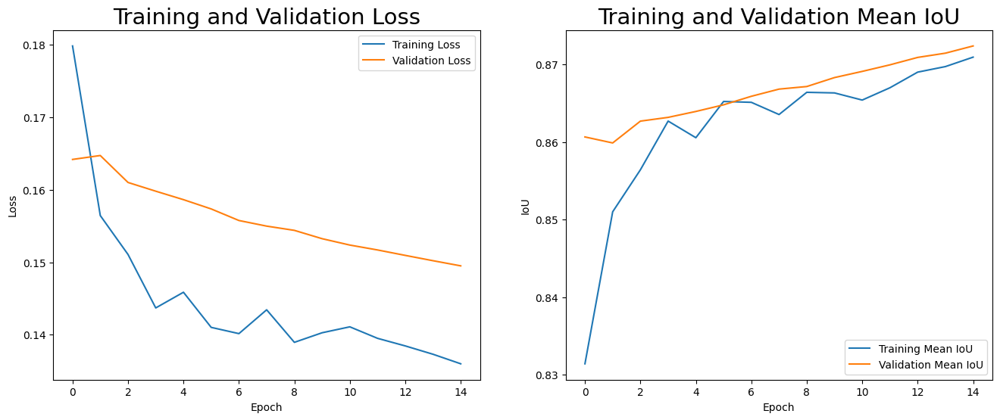

In [19]:
def plot_history(history):
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    iou = history.history['iou_score']
    val_iou = history.history['val_iou_score']
    
    epochs_range = range(len(loss))

    plt.figure(figsize=(16, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, iou, label='Training Mean IoU')
    plt.plot(epochs_range, val_iou, label='Validation Mean IoU')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Mean IoU')
    plt.xlabel('Epoch')
    plt.ylabel('IoU')

    plt.show()

plot_history(history)

In [20]:
print("Оценка на тестовой выборке")
best_model = tf.keras.models.load_model(checkpoint_path, compile=False)
best_model.compile(loss=bce_dice_loss, metrics=['accuracy', iou_metric])

results = best_model.evaluate(test_batches)
print(f"\nРезультаты на тестовой выборке:\nLoss: {results[0]:.4f}\nAccuracy: {results[1]:.4f}\nIoU Score: {results[2]:.4f}")

Оценка на тестовой выборке
     14/Unknown 7s 96ms/step - accuracy: 0.9825 - iou_score: 0.8908 - loss: 0.1049

2025-09-09 13:39:50.090985: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-09-09 13:39:50.271050: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-09-09 13:39:50.451374: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-09-09 13:39:50.628140: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2025-09-09 13:39:50.809278: E external/local_xla/xla/stream_

15/15 ━━━━━━━━━━━━━━━━━━━━ 20s 997ms/step - accuracy: 0.9825 - iou_score: 0.8924 - loss: 0.1048

Результаты на тестовой выборке:
Loss: 0.1048
Accuracy: 0.9825
IoU Score: 0.8924


2025-09-09 13:39:55.746087: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2025-09-09 13:39:55.746131: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
/home/koziy/projects/test-chicken/lib/python3.12/site-packages/keras/src/trainers/epoch_iterator.py:164: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Примеры предсказаний на валидационных данных:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


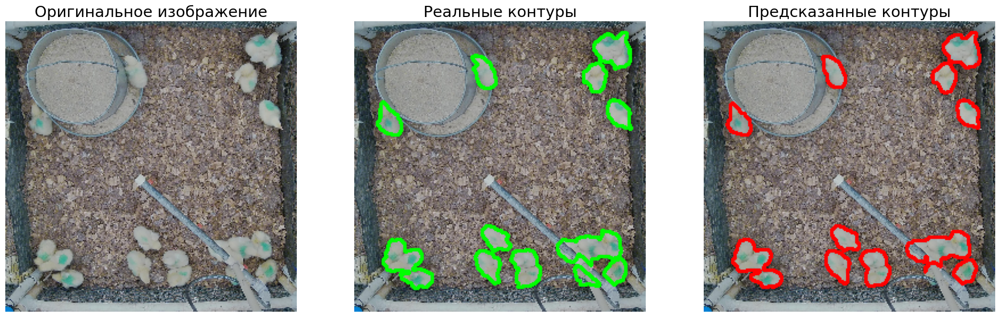

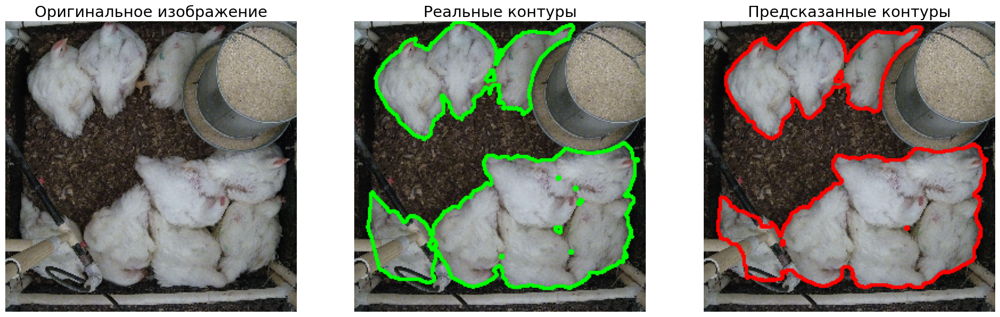

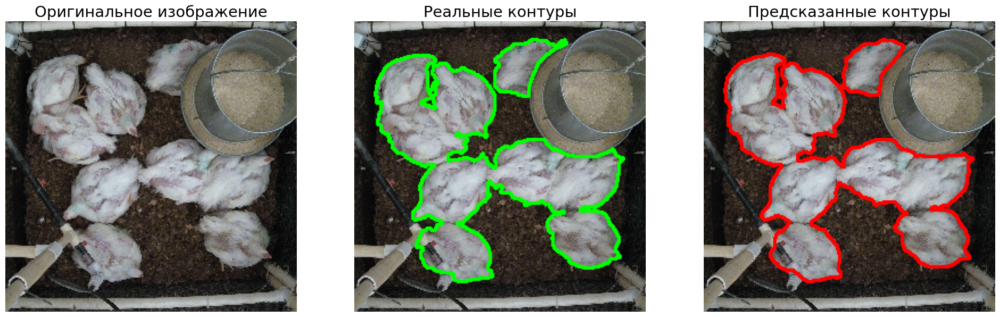

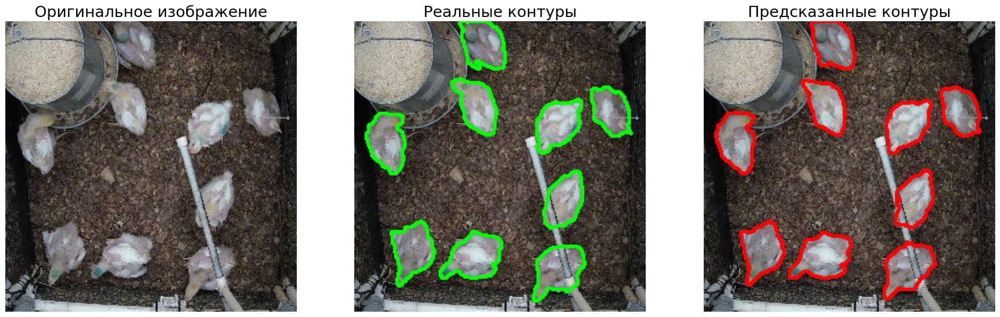

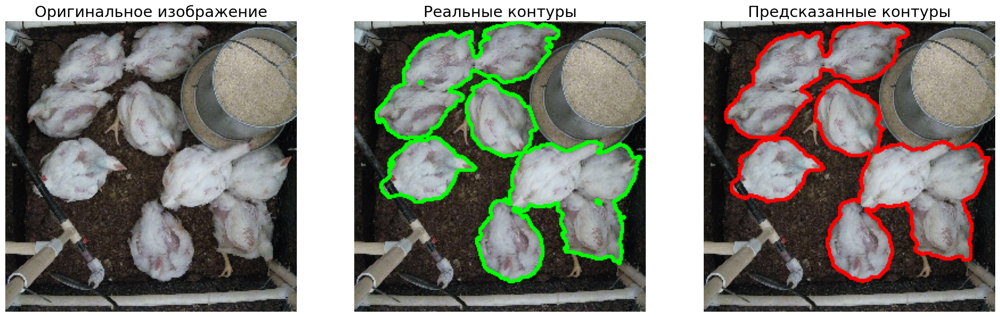

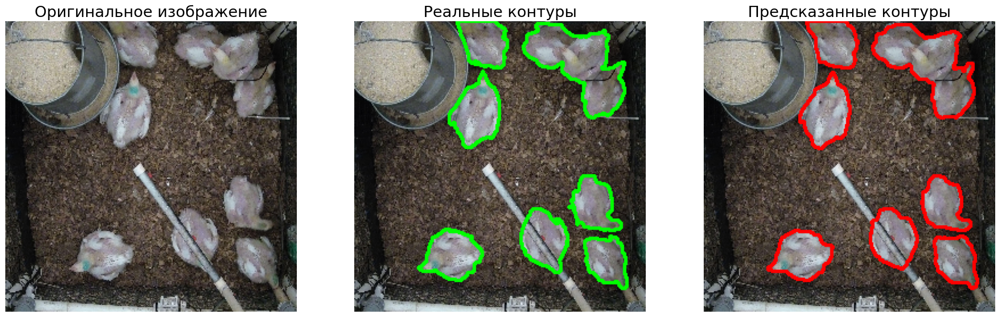

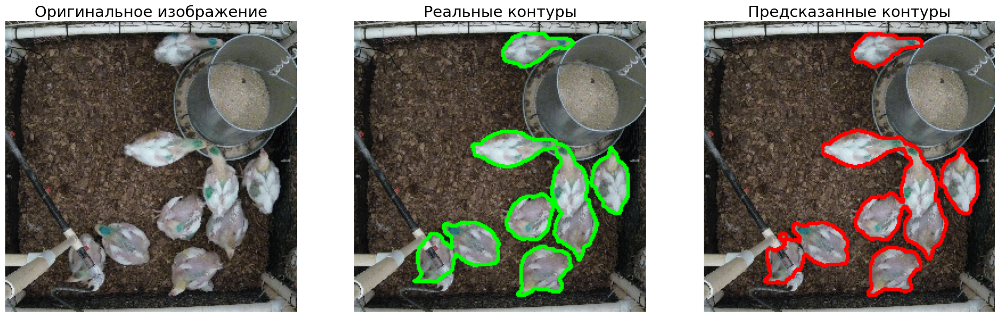

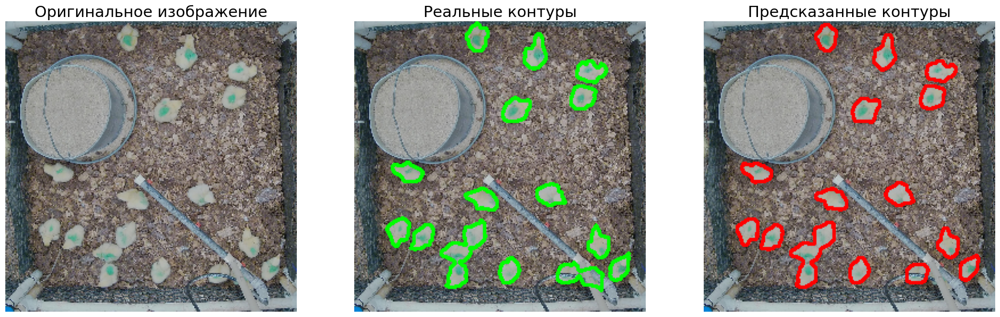

2025-09-09 13:40:24.586335: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [22]:
def show_predictions_with_contours(dataset, num_examples=3):
    print("\nПримеры предсказаний на валидационных данных:")
    
    for images, masks in dataset.take(num_examples):
        pred_masks = model.predict(images)

        for i in range(len(images)):
            original_image = (images[i].numpy() * 255).astype(np.uint8)
            true_mask = (masks[i].numpy() * 255).astype(np.uint8)
            pred_mask = (pred_masks[i] > 0.5).astype(np.uint8) * 255

            image_with_true_contours = original_image.copy()
            true_contours, _ = cv2.findContours(true_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
            cv2.drawContours(image_with_true_contours, true_contours, -1, (0, 255, 0), 2) # Зеленый цвет

            image_with_pred_contours = original_image.copy()
            pred_contours, _ = cv2.findContours(pred_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
            cv2.drawContours(image_with_pred_contours, pred_contours, -1, (255, 0, 0), 2) # Красный цвет

            plt.figure(figsize=(24, 8))
            
            plt.subplot(1, 3, 1)
            plt.imshow(original_image)
            plt.title("Оригинальное изображение")
            plt.axis('off')
            
            plt.subplot(1, 3, 2)
            plt.imshow(image_with_true_contours)
            plt.title("Реальные контуры")
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(image_with_pred_contours)
            plt.title("Предсказанные контуры")
            plt.axis('off')
            
            plt.show()

show_predictions_with_contours(test_batches, num_examples=1) 

# Итоговый вывод

В ходе проекта была успешно решена задача семантической сегментации кур на изображениях. Была разработана, обучена и оценена модель глубокого обучения, показавшая высокое качество предсказаний.

1. Анализ данных и подготовка
Был создан пайплайн обработки данных, который включал:

    Преобразование исходной разметки из формата полигонов в бинарные маски.
    Разделение данных на обучающую, валидационную и тестовую выборки.
    Применение аугментации

2. Моделирование и обучение
После серии экспериментов, был выбран наиболее надежный и эффективный подход:

    Архитектура: U-Net с легким и быстрым предобученным энкодером MobileNetV2.
    Трансферное обучение: Использование весов, предобученных на датасете ImageNet.
    Стратегия Fine-Tuning: Применен двухэтапный процесс обучения.

3. Результаты
Лучшая модель была сохранена на 15-й эпохе и достигла следующих показателей на валидационной выборке:

    IoU Score: 0.8879
    Pixel-wise Accuracy: 0.9754
    Loss: 0.1397

Финальная оценка на отложенной тестовой выборке подтвердила высокое качество модели, показав IoU Score ~0.88.

4. Выводы

    Значение метрики Intersection over Union (IoU), равное ~0.88, свидетельствует о высокой точности сегментации. Модель способна находить четкие и правильные контуры кур на изображениях, которые она не видела в процессе обучения.

Таким образом, разработанное решение полностью выполняет поставленную задачу и может быть использовано как основа для системы автоматического мониторинга в промышленном птицеводстве. Визуальный анализ предсказаний подтверждает высокое качество работы модели.